In [1]:
#Make lists of car and not car images each other

import os
import glob
#from skimage.feature import hog
#from skimage import color, exposure
# images are divided up into vehicles and non-vehicles

#First locate vehicle images
basedir = 'vehicles/'
#Different folders represent different sources for images e.g. GTI, Kitti
image_types = os.listdir(basedir)
cars = []
for imtype in image_types:
    cars.extend(glob.glob(basedir+imtype+'/*'))
    
print('Number of Vehicle Images found:', len(cars))
with open('cars.txt', 'w') as f:
    for fn in cars:
        f.write(fn+'\n')
        
#Do the same thing for non-vehicle images
basedir = 'non-vehicles/'
#Different folders represent different sources for images e.g. GTI, Kitti
image_types = os.listdir(basedir)
notcars = []
for imtype in image_types:
    notcars.extend(glob.glob(basedir+imtype+'/*'))
    
print('Number of Non-Vehicle Images found:', len(notcars))
with open('notcars.txt', 'w') as f:
    for fn in cars:
        f.write(fn+'\n')
        


Number of Vehicle Images found: 8792
Number of Non-Vehicle Images found: 8968


In [33]:
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import numpy as np
import cv2
import time
from skimage.feature import hog
from sklearn.preprocessing import StandardScaler
from sklearn.svm import LinearSVC
from sklearn.model_selection import train_test_split
import pickle
from scipy.ndimage.measurements import label

In [3]:
# Define a function to compute binned color features  
def bin_spatial(img, size=(32, 32)):
    # Use cv2.resize().ravel() to create the feature vector
    features = cv2.resize(img, size).ravel() 
    # Return the feature vector
    return features

In [4]:
# Define a function to compute color histogram features 
# NEED TO CHANGE bins_range if reading .png files with mpimg!
def color_hist(img, nbins=32, bins_range=(0, 256)):
    # Compute the histogram of the color channels separately
    channel1_hist = np.histogram(img[:,:,0], bins=nbins, range=bins_range)
    channel2_hist = np.histogram(img[:,:,1], bins=nbins, range=bins_range)
    channel3_hist = np.histogram(img[:,:,2], bins=nbins, range=bins_range)
    # Concatenate the histograms into a single feature vector
    hist_features = np.concatenate((channel1_hist[0], channel2_hist[0], channel3_hist[0]))
    # Return the individual histograms, bin_centers and feature vector
    return hist_features

In [5]:
# Define a function to return HOG features and visualization
def get_hog_features(img, orient, pix_per_cell, cell_per_block, 
                        vis=False, feature_vec=True):
    # Call with two outputs if vis==True
    if vis == True:
        features, hog_image = hog(img, orientations=orient, 
                                  pixels_per_cell=(pix_per_cell, pix_per_cell),
                                  cells_per_block=(cell_per_block, cell_per_block), 
                                  transform_sqrt=True, 
                                  visualise=vis, feature_vector=feature_vec)
        return features, hog_image
    # Otherwise call with one output
    else:      
        features = hog(img, orientations=orient, 
                       pixels_per_cell=(pix_per_cell, pix_per_cell),
                       cells_per_block=(cell_per_block, cell_per_block), 
                       transform_sqrt=True, 
                       visualise=vis, feature_vector=feature_vec)
        return features

In [6]:
# Define a function to extract features from a list of images
# Have this function call bin_spatial() and color_hist()
def extract_features(imgs, color_space='RGB', spatial_size=(32, 32),
                        hist_bins=32, hist_range=(0, 256), orient=9, 
                        pix_per_cell=8, cell_per_block=2, hog_channel=0,
                        spatial_feat=True, hist_feat=True, hog_feat=True):
    # Create a list to append feature vectors to
    features = []
    # Iterate through the list of images
    for file in imgs:
        file_features = []
        # Read in each one by one
        image = mpimg.imread(file)
        # apply color conversion if other than 'RGB'
        if color_space != 'RGB':
            if color_space == 'HSV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
            elif color_space == 'LUV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2LUV)
            elif color_space == 'HLS':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
            elif color_space == 'YUV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YUV)
            elif color_space == 'YCrCb':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YCrCb)
        else: feature_image = np.copy(image)      

        if spatial_feat == True:
            spatial_features = bin_spatial(feature_image, size=spatial_size)
            file_features.append(spatial_features)
        if hist_feat == True:
            # Apply color_hist()
            hist_features = color_hist(feature_image, nbins=hist_bins)
            file_features.append(hist_features)
        if hog_feat == True:
        # Call get_hog_features() with vis=False, feature_vec=True
            if hog_channel == 'ALL':
                hog_features = []
                for channel in range(feature_image.shape[2]):
                    hog_features.append(get_hog_features(feature_image[:,:,channel], 
                                        orient, pix_per_cell, cell_per_block, 
                                        vis=False, feature_vec=True))
                hog_features = np.ravel(hog_features)        
            else:
                hog_features = get_hog_features(feature_image[:,:,hog_channel], orient, 
                            pix_per_cell, cell_per_block, vis=False, feature_vec=True)
            # Append the new feature vector to the features list
            file_features.append(hog_features)
        features.append(np.concatenate(file_features))
    # Return list of feature vectors
    return features

In [7]:
def pickle_extracted_features(cars, notcars, cspace, orient, px_per_cell, cl_per_block, hog_ch,
                              spat_size=(32,32), hist_bins=32):
    # Set timer to start
    t = time.time()
    # extract each features
    car_features = extract_features(cars, color_space=cspace, spatial_size=spat_size, 
                                    hist_bins=hist_bins, orient=orient, pix_per_cell=px_per_cell, 
                                    cell_per_block=cl_per_block, hog_channel=hog_ch)
    notcar_features = extract_features(notcars, color_space=cspace, spatial_size=spat_size, 
                                       hist_bins=hist_bins, orient=orient, pix_per_cell=px_per_cell,
                                       cell_per_block=cl_per_block, hog_channel=hog_ch)
    # Set timer endpoint
    t2 = time.time()
    print(round(t2-t, 2), ' Seconds to extract features')
    
    X = np.vstack((car_features, notcar_features)).astype(np.float64)
    global X_scaler
    # Fit a per-column scaler
    X_scaler = StandardScaler().fit(X)
    # Apply the scaler to X
    scaled_X = X_scaler.transform(X)
    
    # Define the labels vector
    y = np.hstack((np.ones(len(car_features)),np.zeros(len(notcar_features))))
    
    # save scaler as pickled file
    pick_scalers_labels = 'X_scaler_scaled_X_y.p'
    pickle.dump({'X_scaler':X_scaler,'scaled_X':scaled_X,'y':y},open(pick_scalers_labels,"wb"))
    
    print("The input was: cspace = {}, orient = {},\
    pix_per_cell = {}, cell_per_block = {}".format(cspace,orient,px_per_cell,cl_per_block) )
    print("Extracted features are stored in pickled file:{}".format(pick_scalers_labels))

In [11]:
# Testing functions above - pickle_extracted_features()
cspace='RGB'
orient = 9
pix_per_cell = 8
cell_per_block = 2 
hog_channel = 'ALL'

pickle_extracted_features(cars,notcars,cspace,orient,pix_per_cell,cell_per_block,hog_channel)

/home/carnd/anaconda3/envs/carnd-term1/lib/python3.5/site-packages/skimage/feature/_hog.py:119: skimage_deprecation: Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15
  'be changed to `L2-Hys` in v0.15', skimage_deprecation)


130.65  Seconds to extract features
The input was: cspace = RGB, orient = 9,    pix_per_cell = 8, cell_per_block = 2
Extracted features are stored in pickled file:X_scaler_scaled_X_y.p


In [12]:
def training_with_SVM():
    # read features from pickled data
    pickled_data = pickle.load(open('X_scaler_scaled_X_y.p',"rb"))
    X_scaler = pickled_data["X_scaler"]
    scaled_X = pickled_data["scaled_X"]
    y = pickled_data["y"]
    
    # Split up data into randomized training and test sets
    rand_state = np.random.randint(0,100)
    X_train, X_test, y_train, y_test = train_test_split(scaled_X, y, test_size = 0.2,
                                                        random_state=rand_state)
    
    # Use a linearSVC
    svc = LinearSVC()
    
    # Check the training time for SVC
    # set timer
    t = time.time()
    svc.fit(X_train, y_train)
    t2 = time.time()
    print(round(t2 - t, 2), 'Seconds to train SVC')
    # Check the score of the SVC
    print("Test Accuracy of SVC = ", round(svc.score(X_test, y_test), 4))
    
    with open('svc.pickle','wb') as f:
        pickle.dump(svc,f)
    print('Model saved as [ {} ] file'.format(f.name))
    
    n_predict = 10
    print('My SVC predictions: \n', svc.predict(X_test[0:n_predict]))
    print('For ', n_predict, 'labels: \n', y_test[0:n_predict])

In [13]:
# Test function above - training_with_SVM()
training_with_SVM()

39.07 Seconds to train SVC
Test Accuracy of SVC =  0.9786
Model saved as [ svc.pickle ] file
My SVC predictions: 
 [ 0.  0.  1.  1.  1.  0.  0.  0.  1.  1.]
For  10 labels: 
 [ 0.  0.  1.  1.  0.  0.  0.  0.  1.  1.]


In [14]:
# Define a function to draw bounding boxes
def draw_boxes(img, bboxes, color=(0, 0, 255), thick=6):
    # Make a copy of the image
    imcopy = np.copy(img)
    # Iterate through the bounding boxes
    for bbox in bboxes:
        # Draw a rectangle given bbox coordinates
        cv2.rectangle(imcopy, bbox[0], bbox[1], color, thick)
    # Return the image copy with boxes drawn
    return imcopy

In [15]:
# Define a function that takes an image,
# start and stop positions in both x and y, 
# window size (x and y dimensions),  
# and overlap fraction (for both x and y)
def slide_window(img, x_start_stop=[None, None], y_start_stop=[None, None], 
                    xy_window=(64, 64), xy_overlap=(0.5, 0.5)):
    # If x and/or y start/stop positions not defined, set to image size
    if x_start_stop[0] == None:
        x_start_stop[0] = 0
    if x_start_stop[1] == None:
        x_start_stop[1] = img.shape[1]
    if y_start_stop[0] == None:
        y_start_stop[0] = 0
    if y_start_stop[1] == None:
        y_start_stop[1] = img.shape[0]
    # Compute the span of the region to be searched    
    xspan = x_start_stop[1] - x_start_stop[0]
    yspan = y_start_stop[1] - y_start_stop[0]
    # Compute the number of pixels per step in x/y
    nx_pix_per_step = np.int(xy_window[0]*(1 - xy_overlap[0]))
    ny_pix_per_step = np.int(xy_window[1]*(1 - xy_overlap[1]))
    # Compute the number of windows in x/y
    nx_buffer = np.int(xy_window[0]*(xy_overlap[0]))
    ny_buffer = np.int(xy_window[1]*(xy_overlap[1]))
    nx_windows = np.int((xspan-nx_buffer)/nx_pix_per_step) 
    ny_windows = np.int((yspan-ny_buffer)/ny_pix_per_step) 
    # Initialize a list to append window positions to
    window_list = []
    # Loop through finding x and y window positions
    # Note: you could vectorize this step, but in practice
    # you'll be considering windows one by one with your
    # classifier, so looping makes sense
    for ys in range(ny_windows):
        for xs in range(nx_windows):
            # Calculate window position
            startx = xs*nx_pix_per_step + x_start_stop[0]
            endx = startx + xy_window[0]
            starty = ys*ny_pix_per_step + y_start_stop[0]
            endy = starty + xy_window[1]
            
            # Append window position to list
            window_list.append(((startx, starty), (endx, endy)))
    # Return the list of windows
    return window_list

In [16]:
def convert_color(img, conv='RGB2YCrCb'):
    if conv == 'RGB2YCrCb':
        return cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
    if conv == 'BGR2YCrCb':
        return cv2.cvtColor(img, cv2.COLOR_BGR2YCrCb)
    if conv == 'RGB2LUV':
        return cv2.cvtColor(img, cv2.COLOR_RGB2LUV)
    else:
        return img

In [21]:
# Define a single function that can extract features using hog sub-sampling and make predictions
def find_cars(img, ystart, ystop, scale, svc, X_scaler, cspace, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins):
    
    draw_img = np.copy(img)
    img = img.astype(np.float32)/255
    
    win_list = []
    img_tosearch = img[ystart:ystop,:,:]
    ctrans_tosearch = convert_color(img_tosearch, conv=cspace)
    if scale != 1:
        imshape = ctrans_tosearch.shape
        ctrans_tosearch = cv2.resize(ctrans_tosearch, (np.int(imshape[1]/scale), np.int(imshape[0]/scale)))
        
    ch1 = ctrans_tosearch[:,:,0]
    ch2 = ctrans_tosearch[:,:,1]
    ch3 = ctrans_tosearch[:,:,2]

    # Define blocks and steps as above
    nxblocks = (ch1.shape[1] // pix_per_cell) - cell_per_block + 1
    nyblocks = (ch1.shape[0] // pix_per_cell) - cell_per_block + 1 
    nfeat_per_block = orient*cell_per_block**2
    
    # 64 was the orginal sampling rate, with 8 cells and 8 pix per cell
    window = 64
    nblocks_per_window = (window // pix_per_cell) - cell_per_block + 1
    cells_per_step = 2  # Instead of overlap, define how many cells to step
    nxsteps = (nxblocks - nblocks_per_window) // cells_per_step
    nysteps = (nyblocks - nblocks_per_window) // cells_per_step
    
    # Compute individual channel HOG features for the entire image
    hog1 = get_hog_features(ch1, orient, pix_per_cell, cell_per_block, feature_vec=False)
    hog2 = get_hog_features(ch2, orient, pix_per_cell, cell_per_block, feature_vec=False)
    hog3 = get_hog_features(ch3, orient, pix_per_cell, cell_per_block, feature_vec=False)
    
    for xb in range(nxsteps):
        for yb in range(nysteps):
            ypos = yb*cells_per_step
            xpos = xb*cells_per_step
            # Extract HOG for this patch
            hog_feat1 = hog1[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_feat2 = hog2[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_feat3 = hog3[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_features = np.hstack((hog_feat1, hog_feat2, hog_feat3))

            xleft = xpos*pix_per_cell
            ytop = ypos*pix_per_cell

            # Extract the image patch
            subimg = cv2.resize(ctrans_tosearch[ytop:ytop+window, xleft:xleft+window], (64,64))
          
            # Get color features
            spatial_features = bin_spatial(subimg, size=spatial_size)
            hist_features = color_hist(subimg, nbins=hist_bins)

            # Scale features and make a prediction
            test_features = X_scaler.transform(np.hstack((spatial_features, hist_features, hog_features)).reshape(1, -1))    
            #test_features = X_scaler.transform(np.hstack((shape_feat, hist_feat)).reshape(1, -1))    
            test_prediction = svc.predict(test_features)
            
            if test_prediction == 1:
                xbox_left = np.int(xleft*scale)
                ytop_draw = np.int(ytop*scale)
                win_draw = np.int(window*scale)
                win_list.append(((xbox_left, ytop_draw+ystart),(xbox_left+win_draw,ytop_draw+win_draw+ystart)))
                cv2.rectangle(draw_img,(xbox_left, ytop_draw+ystart),(xbox_left+win_draw,ytop_draw+win_draw+ystart),(0,0,255),6)
                                
    return win_list, draw_img

In [18]:
pix_per_cell

8

/home/carnd/anaconda3/envs/carnd-term1/lib/python3.5/site-packages/skimage/feature/_hog.py:119: skimage_deprecation: Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15
  'be changed to `L2-Hys` in v0.15', skimage_deprecation)


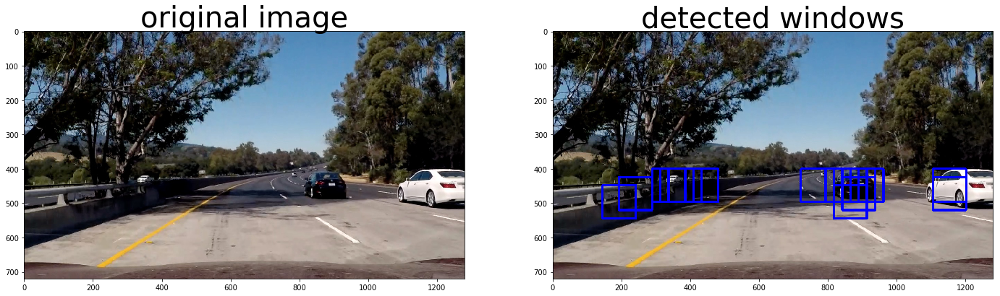

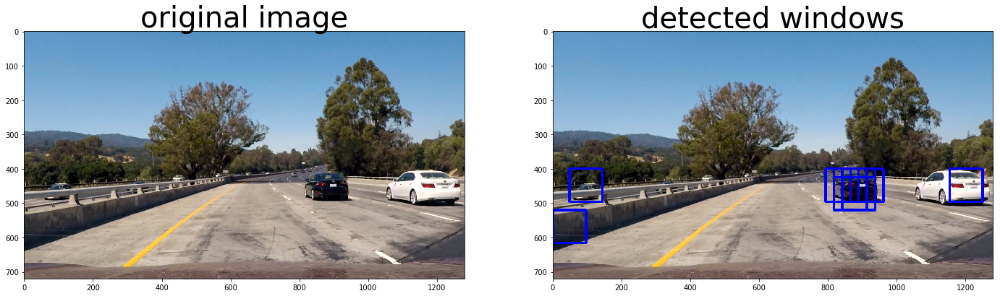

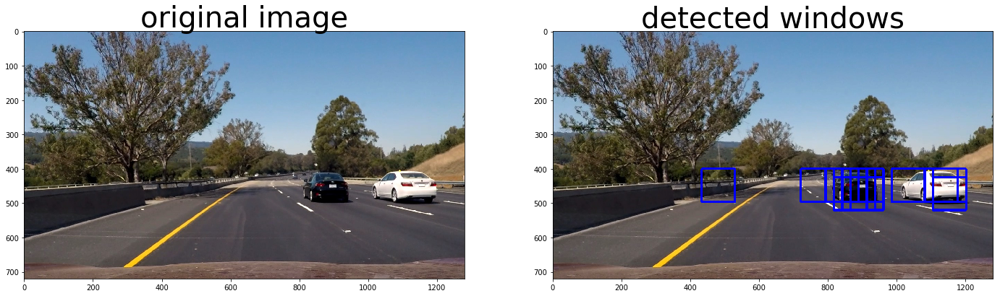

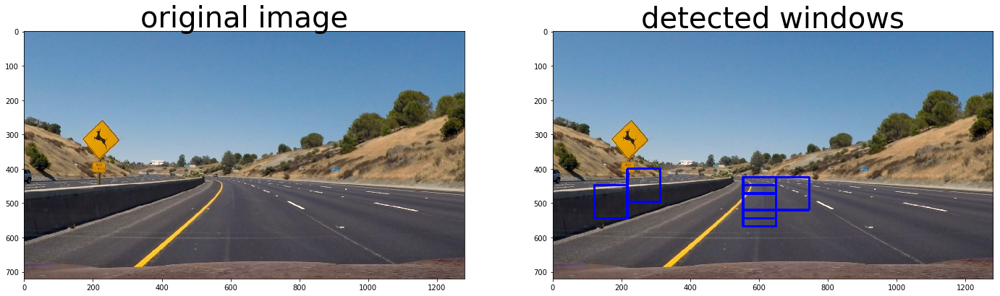

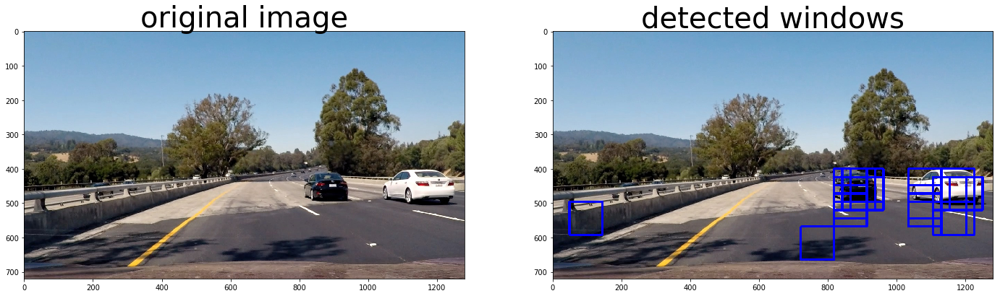

...

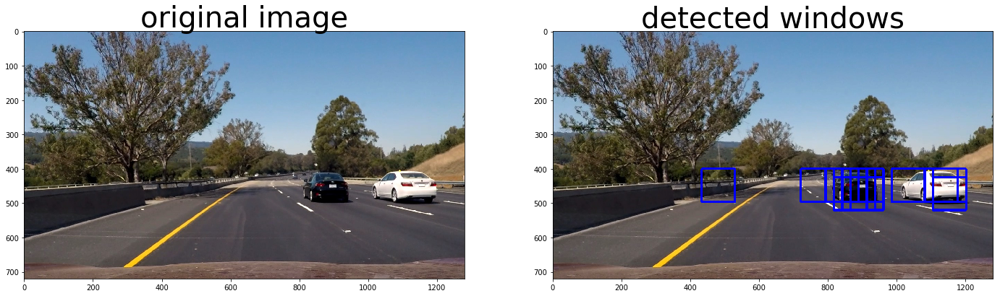

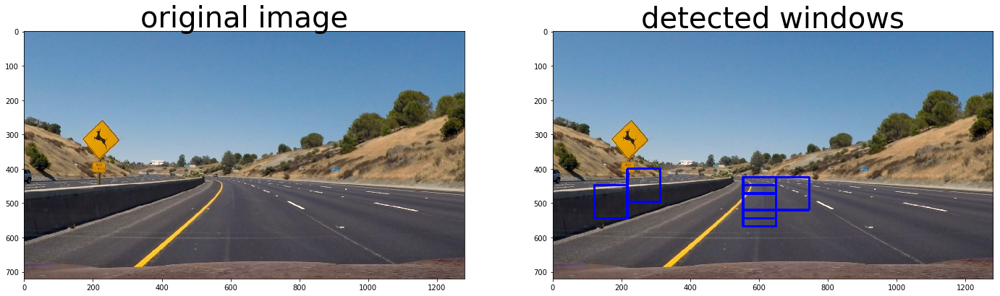

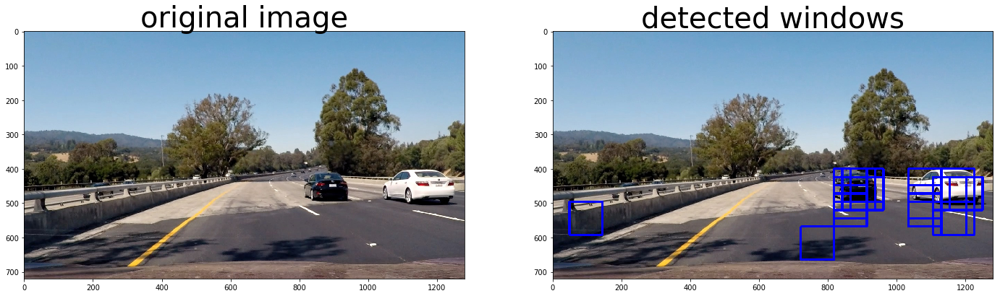

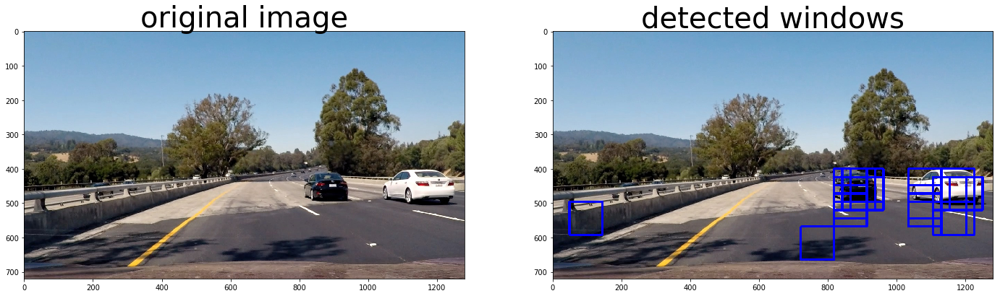

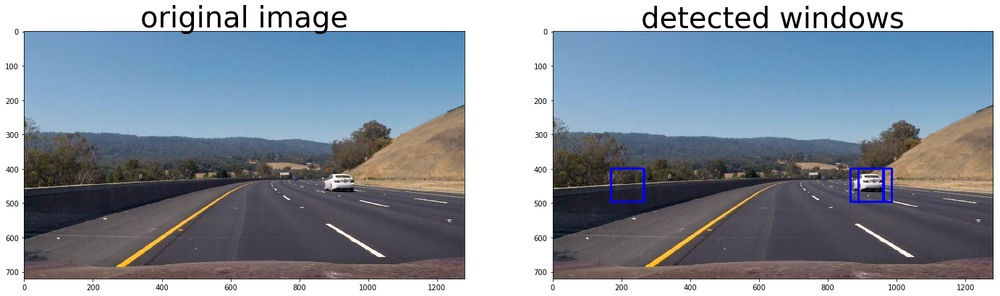

done
[((168, 400), (264, 496)), ((864, 400), (960, 496)), ((888, 400), (984, 496))]


In [23]:
# test function above - find_cars
#image = mpimg.imread('test_images/test3.jpg')

with open('svc.pickle','rb') as f:
    svc = pickle.load(f)
    
scal_data = pickle.load(open('X_scaler_scaled_X_y.p','rb'))
X_scaler = scal_data["X_scaler"]

spatial_size = (32, 32) # Spatial binning dimensions
hist_bins = 32    # Number of histogram bins
ystart = 400
ystop = 700
scale = 1.5


input_directory = 'test_images/'
files = os.listdir(input_directory)
for file in files:
    filename,ext = os.path.splitext(file)
    if ext == '.jpg':
        image = mpimg.imread(input_directory + file)    

        win,img = find_cars(image, ystart, ystop, scale, svc, X_scaler,cspace, orient, pix_per_cell, 
                            cell_per_block, spatial_size, hist_bins)

    f,(ax1,ax2) = plt.subplots(1,2,figsize=(24,9))
    ax1.imshow(image)
    ax1.set_title('original image', fontsize=40)
    ax2.imshow(img)
    ax2.set_title('detected windows', fontsize=40)
    plt.show()
print("done")
print(win)

In [26]:
def search_with_multiscale_windows(img, cspace, orient, pix_per_cell, cell_per_block, 
                                   point_scale_data, spatial_size=(32,32), hist_bins=32):
    
    # Define array to store recent windows
    windows = []
    origin = np.copy(img)
    with open('svc.pickle','rb') as f:
        svc = pickle.load(f)
    
    scal_data = pickle.load(open('X_scaler_scaled_X_y.p','rb'))
    X_scaler = scal_data["X_scaler"]
    
    # input starting y point, stop point, scale with stacked list
    # its used to loop with zip() to maintain combinations
    # ex.
    # point_scale_data = [[a,b,c...]
    #                     [d,e,f...]
    #                     [g,h,i...]]
    #     [ystart=a, ystop=d, scale=g] for 1 Iteration,
    #     [ystart=b, ystop=e, scale=h] for next Iteration .....
    
    ystart=point_scale_data[0]
    ystop=point_scale_data[1]
    scale=point_scale_data[2]
    #print(ystart,ystop,scale)
    
    for y_start,y_end, scales in zip(ystart,ystop,scale):
        win_list, draw_img = find_cars(img, int(y_start), int(y_end), scales, svc, X_scaler, cspace, 
                                       orient,pix_per_cell, cell_per_block, spatial_size, hist_bins)
        
        windows = windows + win_list
    
    return windows

In [37]:
# test function above - find_cars
image = mpimg.imread('test_images/test3.jpg')

y_half = image.shape[0] // 2
y_end = image.shape[0] #- (y_half % 64)
ystart = [y_half,y_half+100]
ystop = [y_end-100, y_end]
scale = [1.5,2.5]
#ystart = [400]
#ystop = [700]
#scale = [1.5]
point_scale_data = np.vstack((ystart,ystop,scale))
print(point_scale_data)
windows = search_with_multiscale_windows(image, cspace, orient, pix_per_cell, cell_per_block, 
                                         point_scale_data, spatial_size=(32,32), hist_bins=32)

print(windows)
print(len(windows))

[[ 360.   460. ]
 [ 620.   720. ]
 [   1.5    2.5]]


/home/carnd/anaconda3/envs/carnd-term1/lib/python3.5/site-packages/skimage/feature/_hog.py:119: skimage_deprecation: Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15
  'be changed to `L2-Hys` in v0.15', skimage_deprecation)


[((648, 432), (744, 528)), ((720, 408), (816, 504)), ((864, 408), (960, 504))]
3


In [28]:
def add_heat(heatmap, win_list):
    # Iterate through list of win_list
    for win in win_list:
        # Add += 1 for all pixels inside each bbox
        # Assuming each "box" takes the form ((x1, y1), (x2, y2))
        heatmap[win[0][1]:win[1][1], win[0][0]:win[1][0]] += 1

    # Return updated heatmap
    return heatmap

In [29]:
def apply_threshold(heatmap, threshold):
    # Zero out pixels below the threshold
    heatmap[heatmap <= threshold] = 0
    # Return thresholded map
    return heatmap

In [30]:
def draw_labeled_windows(img, labels):
    # Iterate through all detected cars
    for car_number in range(1, labels[1]+1):
        # Find pixels with each car_number label value
        nonzero = (labels[0] == car_number).nonzero()
        # Identify x and y values of those pixels
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        # Define a bounding box based on min/max x and y
        win = ((np.min(nonzerox), np.min(nonzeroy)), (np.max(nonzerox), np.max(nonzeroy)))
        # Draw the box on the image
        cv2.rectangle(img, win[0], win[1], (0,0,255), 6)
    # Return the image
    return img

In [47]:
def test_image(image):
    cimg = np.copy(image)
    windows = search_with_multiscale_windows(image, cspace, orient, pix_per_cell, cell_per_block,
                                             point_scale_data, spatial_size=(32,32), hist_bins=32)
    
    # CHECK passed inputs
    #print("for [test_image] input: ystart/stop:{}/{}, scale={}, cspace={},\
    #      orient={}, pix_per_cell={}, cell_per_block={}".format(ystart,ystop,scale,
    #                                                            cspace,orient,
    #                                                           pix_per_cell,cell_per_block))
    
    #print(windows)
    #windows,img = find_cars(image, ystart, ystop, scale, svc, X_scaler,cspace, orient, pix_per_cell, 
    #                        cell_per_block)
    
    # search through the image when it has detected windows
    if len(windows) > 0:
        heat = np.zeros_like(image[:,:,0]).astype(np.float)
        heat = add_heat(heat, windows)
        heat = apply_threshold(heat,2)
        
        heatmap = np.clip(heat, 0, 255)
        labels = label(heatmap)
        draw_img = draw_labeled_windows(cimg, labels)
        
        # Show windows in heated area
        #draw_img = draw_boxes(draw_img, windows)
        #plt.imshow(draw_img)
        
        # Show heat map and window image
        #fig = plt.figure()
        #plt.subplot(211)
        #plt.imshow(draw_img)
        #plt.subplot(212)
        #plt.imshow(heatmap, cmap='hot')
        #fig.tight_layout()
        
        #f,(ax1,ax2) = plt.subplots(1,2,figsize=(24,9))
        #ax1.imshow(draw_img)
        #ax1.set_title('detected windows', fontsize=40)
        #ax2.imshow(heatmap, cmap='hot')
        #ax2.set_title('heatmap', fontsize=40)
        #plt.show()
    
    else:
        print("Nothing detected: No windows found")
    
    return draw_img,heatmap

/home/carnd/anaconda3/envs/carnd-term1/lib/python3.5/site-packages/skimage/feature/_hog.py:119: skimage_deprecation: Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15
  'be changed to `L2-Hys` in v0.15', skimage_deprecation)


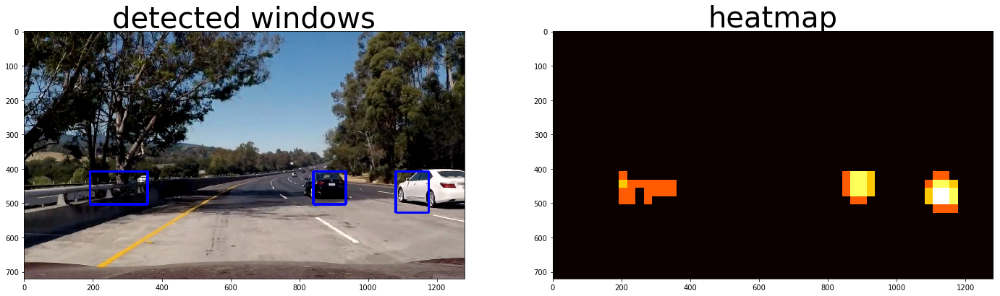

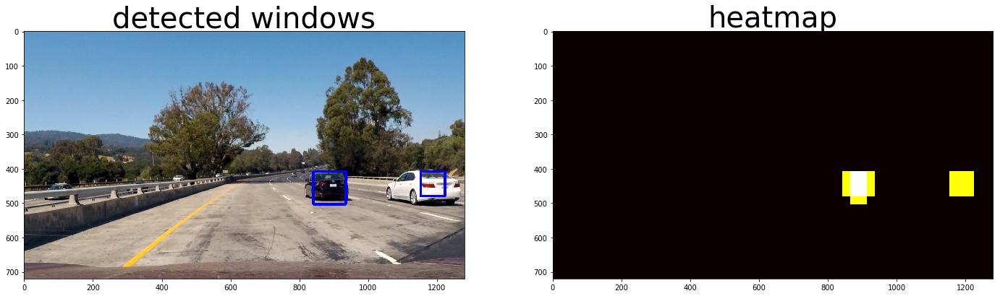

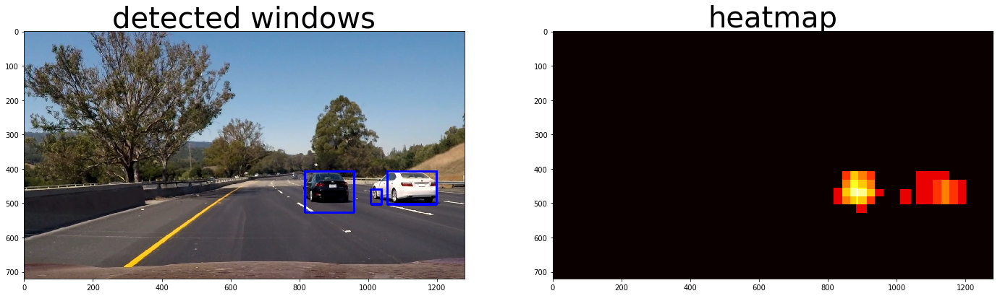

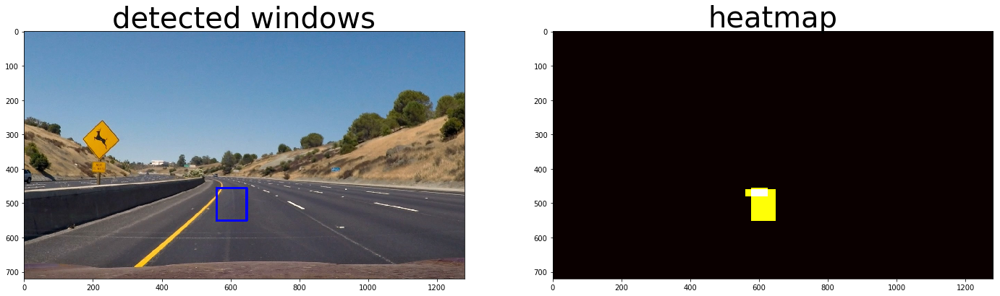

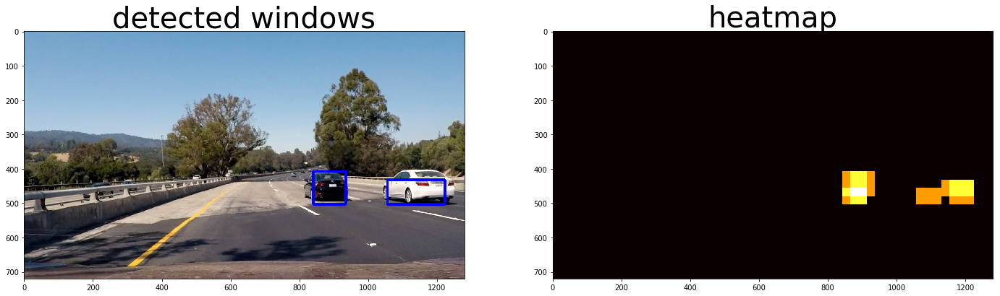

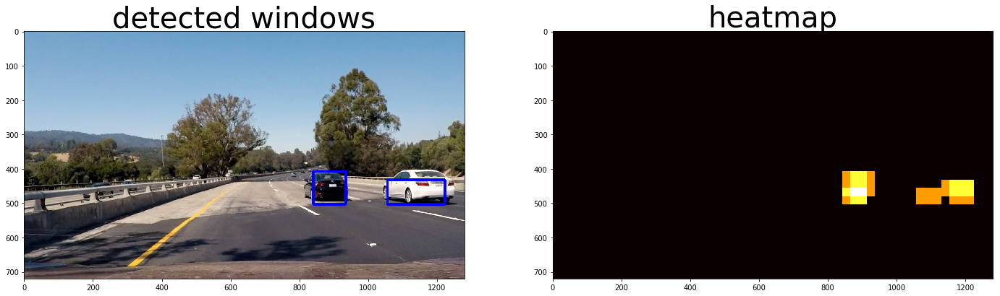

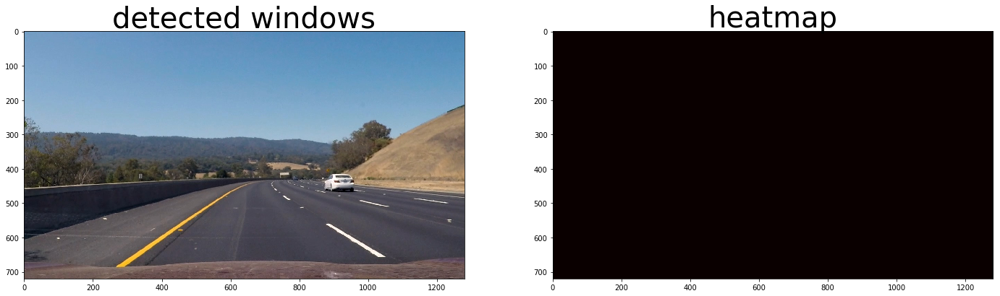

done


In [48]:
# test multiscale window search and heatmap
#image = mpimg.imread('test_images/test3.jpg')
cspace = "YCrCb"
#test_image(image)
input_directory = 'test_images/'
files = os.listdir(input_directory)
for file in files:
    filename,ext = os.path.splitext(file)
    if ext == '.jpg':
        image = mpimg.imread(input_directory + file)    

        img,heat = test_image(image)

    f,(ax1,ax2) = plt.subplots(1,2,figsize=(24,9))
    ax1.imshow(img)
    ax1.set_title('detected windows', fontsize=40)
    ax2.imshow(heat, cmap='hot')
    ax2.set_title('heatmap', fontsize=40)
    plt.show()
print("done")

In [49]:
from collections import deque

In [63]:
iteration = 1

# keep current heatmaps
heatmaps = deque(maxlen=10)
def process_video(image):
    cimg = np.copy(image)
    windows = search_with_multiscale_windows(image, cspace, orient, pix_per_cell, cell_per_block,
                                             point_scale_data)

    #print("iterations: ",iteration)
    global iteration, heatmaps
    if len(windows) > 0:
        heat = np.zeros_like(image[:,:,0]).astype(np.float)
        heat = add_heat(heat, windows)
        heatmaps.append(heat)
        #print(len(heatmaps))
        # take recent 10 heatmaps and average them
        if len(heatmaps) == 10:
            avg_heat = sum(heatmaps)/len(heatmaps)
            heat = avg_heat
        heat = apply_threshold(heat,3)
        heatmap = np.clip(heat, 0, 255)
        #heatmaps.append(heatmap)
        #if iteration % 10 == 0:
        #    avg_heatmaps = sum(heatmaps)/len(heatmaps)
        #    heatmap = avg_heatmaps
        labels = label(heatmap)
        draw_img = draw_labeled_windows(cimg, labels)
    else:
        # pass the image itself if nothing was detected
        draw_img = cimg
    iteration += 1
    return draw_img

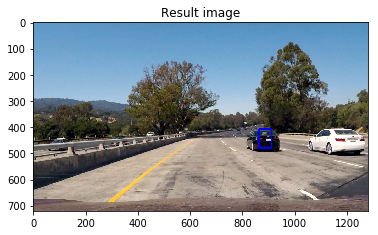

In [64]:
# Test pipe line with test images
#test_images = glob.glob('test_images/*.jpg')
test_image = mpimg.imread('test_images/test1.jpg')

#for test_image in test_images:
#    test_image = np.copy(test_image)
#    print(test_image.dtype)

#for test_image in test_images:
#    test_image = np.copy(test_image)
#    plt.imshow(process_image(test_image))
#    plt.show()

result_img = process_video(test_image)

plt.imshow(result_img)
plt.title('Result image')
plt.show()

In [51]:
from moviepy.editor import VideoFileClip

In [59]:
test_output = 'test.mp4'
clip = VideoFileClip("test_video.mp4")
test_clip = clip.fl_image(process_video)
#%time
test_clip.write_videofile(test_output, audio=False)

[MoviePy] >>>> Building video test.mp4
[MoviePy] Writing video test.mp4


 97%|█████████▋| 38/39 [01:29<00:02,  2.34s/it]


[MoviePy] Done.
[MoviePy] >>>> Video ready: test.mp4 



In [65]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

project_output = 'porject_output1.mp4'
clip = VideoFileClip("project_video.mp4").subclip(5,10)
test_clip = clip.fl_image(process_video)
#%time
test_clip.write_videofile(project_output, audio=False)

[MoviePy] >>>> Building video porject_output1.mp4
[MoviePy] Writing video porject_output1.mp4



 99%|█████████▉| 125/126 [04:55<00:02,  2.32s/it]


[MoviePy] Done.
[MoviePy] >>>> Video ready: porject_output1.mp4 



In [ ]:
###The below codes are trials.
###I leave them to prepare in the case I'll use them.

/home/carnd/anaconda3/envs/carnd-term1/lib/python3.5/site-packages/skimage/feature/_hog.py:119: skimage_deprecation: Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15
  'be changed to `L2-Hys` in v0.15', skimage_deprecation)


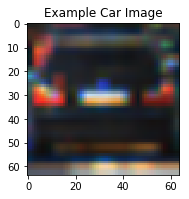

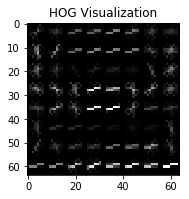

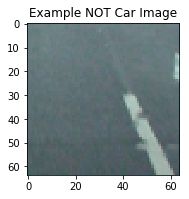

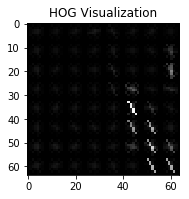

In [3]:
# Define a function to return HOG features and visualization
# Features will always be the first element of the return
# Image data will be returned as the second element if visualize= True
# Otherwise there is no second return element



# Generate a random index to look at a car image
ind = np.random.randint(0, len(cars))
# Read in the image
car_image = mpimg.imread(cars[ind])
gray = cv2.cvtColor(car_image, cv2.COLOR_RGB2GRAY)

# Call our function with vis=True to see an image output
car_features, car_hog_image = get_hog_features(gray, orient= 9, 
                        pix_per_cell= 8, cell_per_block= 2, 
                        vis=True, feature_vec=False)


# Plot the examples
fig = plt.figure()
plt.subplot(121)
plt.imshow(car_image, cmap='gray')
plt.title('Example Car Image')
plt.show()
plt.subplot(122)
plt.imshow(car_hog_image, cmap='gray')
plt.title('HOG Visualization')
plt.show()

# Generate a random index to look at a notcar image
ind = np.random.randint(0, len(notcars))
# Read in the image
notcar_image = mpimg.imread(notcars[ind])
gray = cv2.cvtColor(notcar_image, cv2.COLOR_RGB2GRAY)

# Call our function with vis=True to see an image output
notcar_features, notcar_hog_image = get_hog_features(gray, orient= 9, 
                        pix_per_cell= 8, cell_per_block= 2, 
                        vis=True, feature_vec=False)


# Plot the examples
fig = plt.figure()
plt.subplot(121)
plt.imshow(notcar_image, cmap='gray')
plt.title('Example NOT Car Image')
plt.show()
plt.subplot(122)
plt.imshow(notcar_hog_image, cmap='gray')
plt.title('HOG Visualization')
plt.show()

/home/carnd/anaconda3/envs/carnd-term1/lib/python3.5/site-packages/skimage/feature/_hog.py:119: skimage_deprecation: Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15
  'be changed to `L2-Hys` in v0.15', skimage_deprecation)


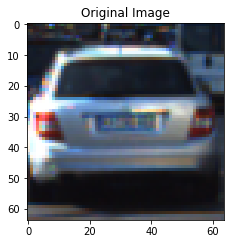

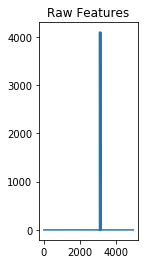

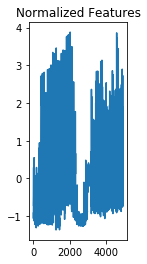

In [4]:





        
car_features = extract_features(cars, color_space='RGB', spatial_size=(32, 32),
                        hist_bins=32, hist_range=(0, 256))
notcar_features = extract_features(notcars, color_space='RGB', spatial_size=(32, 32),
                        hist_bins=32, hist_range=(0, 256))

if len(car_features) > 0:
    # Create an array stack of feature vectors
    X = np.vstack((car_features, notcar_features)).astype(np.float64)                        
    # Fit a per-column scaler
    X_scaler = StandardScaler().fit(X)
    # Apply the scaler to X
    scaled_X = X_scaler.transform(X)
    car_ind = np.random.randint(0, len(cars))
    # Plot an example of raw and scaled features
    fig = plt.figure(figsize=(12,4))
    plt.subplot(131)
    plt.imshow(mpimg.imread(cars[car_ind]))
    plt.title('Original Image')
    plt.show()
    plt.subplot(132)
    plt.plot(X[car_ind])
    plt.title('Raw Features')
    plt.show()
    plt.subplot(133)
    plt.plot(scaled_X[car_ind])
    plt.title('Normalized Features')
    plt.show()
    fig.tight_layout()
else: 
    print('Your function only returns empty feature vectors...')

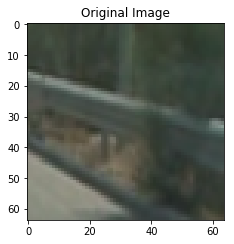

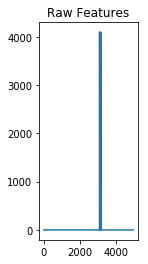

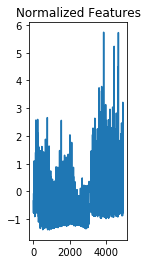

In [5]:
#Show NON-vehicle image feature

if len(notcar_features) > 0:
    notcar_ind = np.random.randint(0, len(notcars))
    # Plot an example of raw and scaled features
    fig = plt.figure(figsize=(12,4))
    plt.subplot(131)
    plt.imshow(mpimg.imread(notcars[notcar_ind]))
    plt.title('Original Image')
    plt.show()
    plt.subplot(132)
    plt.plot(X[notcar_ind])
    plt.title('Raw Features')
    plt.show()
    plt.subplot(133)
    plt.plot(scaled_X[notcar_ind])
    plt.title('Normalized Features')
    plt.show()
    fig.tight_layout()
else: 
    print('Your function only returns empty feature vectors...')

In [6]:
# performs under different binning scenarios
spatial = 32
histbin = 32

car_features = extract_features(cars, color_space='RGB', spatial_size=(spatial, spatial),
                        hist_bins=histbin, hist_range=(0, 256))
notcar_features = extract_features(notcars, color_space='RGB', spatial_size=(spatial, spatial),
                        hist_bins=histbin, hist_range=(0, 256))

# Create an array stack of feature vectors
X = np.vstack((car_features, notcar_features)).astype(np.float64)                        
# Fit a per-column scaler
X_scaler = StandardScaler().fit(X)
# Apply the scaler to X
scaled_X = X_scaler.transform(X)

# Define the labels vector
y = np.hstack((np.ones(len(car_features)), np.zeros(len(notcar_features))))


# Split up data into randomized training and test sets
rand_state = np.random.randint(0, 100)
X_train, X_test, y_train, y_test = train_test_split(
    scaled_X, y, test_size=0.2, random_state=rand_state)

print('Using spatial binning of:',spatial,
    'and', histbin,'histogram bins')
print('Feature vector length:', len(X_train[0]))
# Use a linear SVC 
svc = LinearSVC()
# Check the training time for the SVC
t=time.time()
svc.fit(X_train, y_train)
t2 = time.time()
print(round(t2-t, 2), 'Seconds to train SVC...')
# Check the score of the SVC
print('Test Accuracy of SVC = ', round(svc.score(X_test, y_test), 4))
# Check the prediction time for a single sample
t=time.time()
n_predict = 10
print('My SVC predicts: ', svc.predict(X_test[0:n_predict]))
print('For these',n_predict, 'labels: ', y_test[0:n_predict])
t2 = time.time()
print(round(t2-t, 5), 'Seconds to predict', n_predict,'labels with SVC')

with open('feature.pickle', mode='wb') as f:
    pickle.dump(svc.fit(X_train, y_train), f)


/home/carnd/anaconda3/envs/carnd-term1/lib/python3.5/site-packages/skimage/feature/_hog.py:119: skimage_deprecation: Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15
  'be changed to `L2-Hys` in v0.15', skimage_deprecation)


Using spatial binning of: 32 and 32 histogram bins
Feature vector length: 4932
22.22 Seconds to train SVC...
Test Accuracy of SVC =  0.9688
My SVC predicts:  [ 1.  1.  1.  1.  0.  1.  1.  0.  1.  1.]
For these 10 labels:  [ 1.  1.  1.  1.  0.  1.  1.  0.  1.  1.]
0.00368 Seconds to predict 10 labels with SVC


In [7]:
# Extract HOG features
colorspace = 'RGB' # Can be RGB, HSV, LUV, HLS, YUV, YCrCb
orient = 9
pix_per_cell = 8
cell_per_block = 2
hog_channel = "ALL" # Can be 0, 1, 2, or "ALL"

t=time.time()
car_features = extract_features(cars, color_space=colorspace, orient=orient, 
                        pix_per_cell=pix_per_cell, cell_per_block=cell_per_block, 
                        hog_channel=hog_channel)
notcar_features = extract_features(notcars, color_space=colorspace, orient=orient, 
                        pix_per_cell=pix_per_cell, cell_per_block=cell_per_block, 
                        hog_channel=hog_channel)
t2 = time.time()
print(round(t2-t, 2), 'Seconds to extract HOG features...')
# Create an array stack of feature vectors
X = np.vstack((car_features, notcar_features)).astype(np.float64)                        
# Fit a per-column scaler
X_scaler = StandardScaler().fit(X)
# Apply the scaler to X
scaled_X = X_scaler.transform(X)

# Define the labels vector
y = np.hstack((np.ones(len(car_features)), np.zeros(len(notcar_features))))


# Split up data into randomized training and test sets
rand_state = np.random.randint(0, 100)
X_train, X_test, y_train, y_test = train_test_split(
    scaled_X, y, test_size=0.2, random_state=rand_state)

print('Using:',orient,'orientations',pix_per_cell,
    'pixels per cell and', cell_per_block,'cells per block')
print('Feature vector length:', len(X_train[0]))
# Use a linear SVC 
svc = LinearSVC()
# Check the training time for the SVC
t=time.time()
svc.fit(X_train, y_train)
t2 = time.time()
print(round(t2-t, 2), 'Seconds to train SVC...')
# Check the score of the SVC
print('Test Accuracy of SVC = ', round(svc.score(X_test, y_test), 4))
# Check the prediction time for a single sample
t=time.time()
n_predict = 10
print('My SVC predicts: ', svc.predict(X_test[0:n_predict]))
print('For these',n_predict, 'labels: ', y_test[0:n_predict])
t2 = time.time()
print(round(t2-t, 5), 'Seconds to predict', n_predict,'labels with SVC')

with open('hog_feature.pickle', mode='wb') as f:
    pickle.dump(svc.fit(X_train, y_train), f)

/home/carnd/anaconda3/envs/carnd-term1/lib/python3.5/site-packages/skimage/feature/_hog.py:119: skimage_deprecation: Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15
  'be changed to `L2-Hys` in v0.15', skimage_deprecation)


130.32 Seconds to extract HOG features...
Using: 9 orientations 8 pixels per cell and 2 cells per block
Feature vector length: 8460
38.5 Seconds to train SVC...
Test Accuracy of SVC =  0.9797
My SVC predicts:  [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  1.]
For these 10 labels:  [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  1.]
0.00376 Seconds to predict 10 labels with SVC


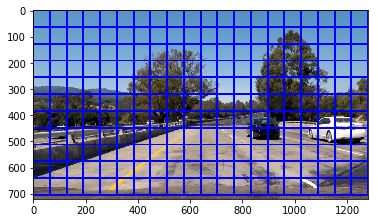

In [6]:
image = mpimg.imread('test_images/test1.jpg')





windows = slide_window(image, x_start_stop=[None, None], y_start_stop=[None, None], 
                    xy_window=(128, 128), xy_overlap=(0.5, 0.5))
                       
window_img = draw_boxes(image, windows, color=(0, 0, 255), thick=6)                    
plt.imshow(window_img)
plt.show()

In [7]:
# define a function plotting multiple images
def visualize(fig, row, col, imgs, titles):
    for i, img in enumerate(imgs):
        plt.subplot(row, col, i+1)
        plt.title(i+1)
        img_dim =len(img.shape)
        if img_dim < 3:
            plt.imshow(img, cmap='hot')
            plt.title(i)
            plt.show()
        else:
            plt.imshow(img)
            plt.title(i)
            plt.show()

0.0 1.0


/home/carnd/anaconda3/envs/carnd-term1/lib/python3.5/site-packages/skimage/feature/_hog.py:119: skimage_deprecation: Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15
  'be changed to `L2-Hys` in v0.15', skimage_deprecation)


0.8018741607666016 second to process one image searching 100 windows
0.0 1.0
0.8023607730865479 second to process one image searching 100 windows
0.0 1.0
0.8035123348236084 second to process one image searching 100 windows
0.0 1.0
0.8032522201538086 second to process one image searching 100 windows
0.0 1.0
0.7980225086212158 second to process one image searching 100 windows
0.0 1.0
0.8042824268341064 second to process one image searching 100 windows


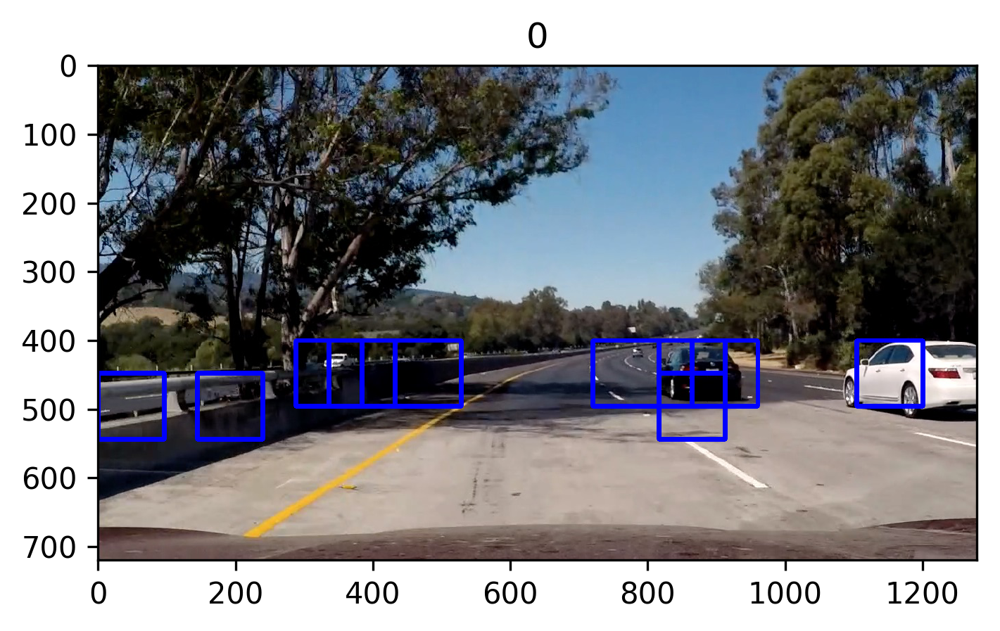

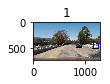

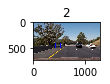

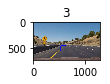

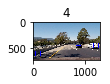

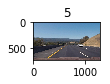

In [10]:
# Define a function to extract features from a single image window
# This function is very similar to extract_features()
# just for a single image rather than list of images
def single_img_features(img, color_space='RGB', spatial_size=(32, 32),
                        hist_bins=32, orient=9, 
                        pix_per_cell=8, cell_per_block=2, hog_channel=0,
                        spatial_feat=True, hist_feat=True, hog_feat=True):    
    #1) Define an empty list to receive features
    img_features = []
    #2) Apply color conversion if other than 'RGB'
    if color_space != 'RGB':
        if color_space == 'HSV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
        elif color_space == 'LUV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2LUV)
        elif color_space == 'HLS':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
        elif color_space == 'YUV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
        elif color_space == 'YCrCb':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
    else: feature_image = np.copy(img)      
    #3) Compute spatial features if flag is set
    if spatial_feat == True:
        spatial_features = bin_spatial(feature_image, size=spatial_size)
        #4) Append features to list
        img_features.append(spatial_features)
    #5) Compute histogram features if flag is set
    if hist_feat == True:
        hist_features = color_hist(feature_image, nbins=hist_bins)
        #6) Append features to list
        img_features.append(hist_features)
    #7) Compute HOG features if flag is set
    if hog_feat == True:
        if hog_channel == 'ALL':
            hog_features = []
            for channel in range(feature_image.shape[2]):
                hog_features.extend(get_hog_features(feature_image[:,:,channel], 
                                    orient, pix_per_cell, cell_per_block, 
                                    vis=False, feature_vec=True))      
        else:
            hog_features = get_hog_features(feature_image[:,:,hog_channel], orient, 
                        pix_per_cell, cell_per_block, vis=False, feature_vec=True)
        #8) Append features to list
        img_features.append(hog_features)

    #9) Return concatenated array of features
    return np.concatenate(img_features)

# Define a function you will pass an image 
# and the list of windows to be searched (output of slide_windows())
def search_windows(img, windows, clf, scaler, color_space='RGB', 
                    spatial_size=(32, 32), hist_bins=32, 
                    hist_range=(0, 256), orient=9, 
                    pix_per_cell=8, cell_per_block=2, 
                    hog_channel=0, spatial_feat=True, 
                    hist_feat=True, hog_feat=True):

    #1) Create an empty list to receive positive detection windows
    on_windows = []
    #2) Iterate over all windows in the list
    for window in windows:
        #3) Extract the test window from original image
        test_img = cv2.resize(img[window[0][1]:window[1][1], window[0][0]:window[1][0]], (64, 64))      
        #4) Extract features for that window using single_img_features()
        features = single_img_features(test_img, color_space=color_space, 
                            spatial_size=spatial_size, hist_bins=hist_bins, 
                            orient=orient, pix_per_cell=pix_per_cell, 
                            cell_per_block=cell_per_block, 
                            hog_channel=hog_channel, spatial_feat=spatial_feat, 
                            hist_feat=hist_feat, hog_feat=hog_feat)
        #5) Scale extracted features to be fed to classifier
        test_features = scaler.transform(np.array(features).reshape(1, -1))
        #6) Predict using your classifier
        prediction = clf.predict(test_features)
        #7) If positive (prediction == 1) then save the window
        if prediction == 1:
            on_windows.append(window)
    #8) Return windows for positive detections
    return on_windows

color_space = 'RGB' # Can be RGB, HSV, LUV, HLS, YUV, YCrCb
orient = 9  # HOG orientations
pix_per_cell = 8 # HOG pixels per cell
cell_per_block = 2 # HOG cells per block
hog_channel = "ALL" # Can be 0, 1, 2, or "ALL"
#spatial_size = (16, 16) # Spatial binning dimensions
spatial_size = (32, 32) # Spatial binning dimensions
#hist_bins = 16    # Number of histogram bins
hist_bins = 32    # Number of histogram bins
spatial_feat = True # Spatial features on or off
hist_feat = True # Histogram features on or off
hog_feat = True # HOG features on or off
y_start_stop = [400, 656] # Min and max in y to search in slide_window()

searchpath = 'test_images/*'
example_images = glob.glob(searchpath)
images = []
titles = []

for image_src in example_images:
    t1 = time.time()
    image = mpimg.imread(image_src)
    draw_image = np.copy(image)
    image = image.astype(np.float32)/255
    print(np.min(image),np.max(image))
    
    windows = slide_window(image, x_start_stop=[None, None], y_start_stop=y_start_stop, 
                    xy_window=(96, 96), xy_overlap=(0.5, 0.5))
 
    hot_windows = search_windows(image, windows, svc, X_scaler, color_space=color_space, 
                        spatial_size=spatial_size, hist_bins=hist_bins, 
                        orient=orient, pix_per_cell=pix_per_cell, 
                        cell_per_block=cell_per_block, 
                        hog_channel=hog_channel, spatial_feat=spatial_feat, 
                        hist_feat=hist_feat, hog_feat=hog_feat) 
    
    window_img = draw_boxes(draw_image, hot_windows, color=(0, 0, 255), thick=6)
    
    images.append(window_img)
    titles.append('')
    print(time.time()-t1, 'second to process one image searching', len(windows), 'windows')

fig = plt.figure(figsize=(12,18), dpi=300)
visualize(fig, 5, 2, images, titles)


#image = mpimg.imread('test_images/test1.jpg')
#draw_image = np.copy(image)

# Uncomment the following line if you extracted training
# data from .png images (scaled 0 to 1 by mpimg) and the
# image you are searching is a .jpg (scaled 0 to 255)
#image = image.astype(np.float32)/255

#windows = slide_window(image, x_start_stop=[None, None], y_start_stop=y_start_stop, 
#                    xy_window=(96, 96), xy_overlap=(0.5, 0.5))

#hot_windows = search_windows(image, windows, svc, X_scaler, color_space=color_space, 
#                        spatial_size=spatial_size, hist_bins=hist_bins, 
#                        orient=orient, pix_per_cell=pix_per_cell, 
#                        cell_per_block=cell_per_block, 
#                        hog_channel=hog_channel, spatial_feat=spatial_feat, 
#                        hist_feat=hist_feat, hog_feat=hog_feat)                       

#window_img = draw_boxes(draw_image, hot_windows, color=(0, 0, 255), thick=6)                    

#plt.imshow(window_img)
#plt.show()

/home/carnd/anaconda3/envs/carnd-term1/lib/python3.5/site-packages/skimage/feature/_hog.py:119: skimage_deprecation: Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15
  'be changed to `L2-Hys` in v0.15', skimage_deprecation)


0.23735523223876953 second tp run, total windows = 0
0.24131250381469727 second tp run, total windows = 0
0.24364638328552246 second tp run, total windows = 0
0.24592137336730957 second tp run, total windows = 0
0.24823999404907227 second tp run, total windows = 0
0.2504572868347168 second tp run, total windows = 0
0.25280261039733887 second tp run, total windows = 0
0.25501108169555664 second tp run, total windows = 0
0.25731945037841797 second tp run, total windows = 0
0.25963425636291504 second tp run, total windows = 0
0.26184749603271484 second tp run, total windows = 0
0.26402711868286133 second tp run, total windows = 0
0.2661564350128174 second tp run, total windows = 0
0.26837992668151855 second tp run, total windows = 0
0.27063941955566406 second tp run, total windows = 0
0.2728283405303955 second tp run, total windows = 0
0.27499961853027344 second tp run, total windows = 0
0.27718615531921387 second tp run, total windows = 0
0.2793769836425781 second tp run, total windows =

0.642162561416626 second tp run, total windows = 0
0.6444520950317383 second tp run, total windows = 0
0.6466212272644043 second tp run, total windows = 0
0.6488089561462402 second tp run, total windows = 0
0.6510009765625 second tp run, total windows = 0
0.6531894207000732 second tp run, total windows = 0
0.655501127243042 second tp run, total windows = 0
0.6576476097106934 second tp run, total windows = 0
0.6599636077880859 second tp run, total windows = 0
0.6620690822601318 second tp run, total windows = 0
0.6643271446228027 second tp run, total windows = 0
0.6664910316467285 second tp run, total windows = 0
0.6687881946563721 second tp run, total windows = 0
0.6709756851196289 second tp run, total windows = 0
0.6731750965118408 second tp run, total windows = 0
0.6753494739532471 second tp run, total windows = 0
0.6775376796722412 second tp run, total windows = 0
0.6797447204589844 second tp run, total windows = 0
0.6819379329681396 second tp run, total windows = 0
0.684149503707885

0.4556844234466553 second tp run, total windows = 0
0.45807886123657227 second tp run, total windows = 0
0.46030473709106445 second tp run, total windows = 0
0.46253395080566406 second tp run, total windows = 0
0.46469950675964355 second tp run, total windows = 0
0.46697282791137695 second tp run, total windows = 0
0.4691638946533203 second tp run, total windows = 0
0.4713408946990967 second tp run, total windows = 0
0.4735605716705322 second tp run, total windows = 0
0.4758162498474121 second tp run, total windows = 0
0.4779984951019287 second tp run, total windows = 0
0.4802103042602539 second tp run, total windows = 0
0.48245692253112793 second tp run, total windows = 0
0.48464155197143555 second tp run, total windows = 0
0.4868628978729248 second tp run, total windows = 0
0.48900413513183594 second tp run, total windows = 0
0.491239070892334 second tp run, total windows = 0
0.49343013763427734 second tp run, total windows = 0
0.4956073760986328 second tp run, total windows = 0
0.49

0.8575272560119629 second tp run, total windows = 0
0.860626220703125 second tp run, total windows = 0
0.8629825115203857 second tp run, total windows = 0
0.8651561737060547 second tp run, total windows = 0
0.8673915863037109 second tp run, total windows = 0
0.8695893287658691 second tp run, total windows = 0
0.8718092441558838 second tp run, total windows = 0
0.8739984035491943 second tp run, total windows = 0
0.8762660026550293 second tp run, total windows = 0
0.8785791397094727 second tp run, total windows = 0
0.8807730674743652 second tp run, total windows = 0
0.88301682472229 second tp run, total windows = 0
0.8851776123046875 second tp run, total windows = 0
0.8873627185821533 second tp run, total windows = 0
0.8895695209503174 second tp run, total windows = 0
0.8917586803436279 second tp run, total windows = 0
0.8939268589019775 second tp run, total windows = 0
0.8961203098297119 second tp run, total windows = 0
0.898357629776001 second tp run, total windows = 0
0.90048313140869

0.6474559307098389 second tp run, total windows = 0
0.6498658657073975 second tp run, total windows = 0
0.6521270275115967 second tp run, total windows = 0
0.6543927192687988 second tp run, total windows = 0
0.6567027568817139 second tp run, total windows = 0
0.6589741706848145 second tp run, total windows = 0
0.6611194610595703 second tp run, total windows = 0
0.6634082794189453 second tp run, total windows = 0
0.6655316352844238 second tp run, total windows = 0
0.6678037643432617 second tp run, total windows = 0
0.6700658798217773 second tp run, total windows = 0
0.6723482608795166 second tp run, total windows = 0
0.6745002269744873 second tp run, total windows = 0
0.6767144203186035 second tp run, total windows = 0
0.6788501739501953 second tp run, total windows = 0
0.6808774471282959 second tp run, total windows = 0
0.6831457614898682 second tp run, total windows = 0
0.6854078769683838 second tp run, total windows = 0
0.6876049041748047 second tp run, total windows = 0
0.6897294521

0.4373166561126709 second tp run, total windows = 0
0.4396674633026123 second tp run, total windows = 0
0.44189023971557617 second tp run, total windows = 0
0.4441685676574707 second tp run, total windows = 0
0.4463667869567871 second tp run, total windows = 0
0.4486088752746582 second tp run, total windows = 0
0.4506957530975342 second tp run, total windows = 0
0.45293593406677246 second tp run, total windows = 0
0.4551868438720703 second tp run, total windows = 0
0.45740222930908203 second tp run, total windows = 0
0.4596526622772217 second tp run, total windows = 0
0.46186089515686035 second tp run, total windows = 0
0.464064359664917 second tp run, total windows = 0
0.46622443199157715 second tp run, total windows = 0
0.4684329032897949 second tp run, total windows = 0
0.4705660343170166 second tp run, total windows = 0
0.472761869430542 second tp run, total windows = 0
0.47493600845336914 second tp run, total windows = 0
0.4769916534423828 second tp run, total windows = 0
0.479227

0.8423738479614258 second tp run, total windows = 0
0.8448035717010498 second tp run, total windows = 0
0.8469676971435547 second tp run, total windows = 0
0.8492412567138672 second tp run, total windows = 0
0.8514788150787354 second tp run, total windows = 0
0.853687047958374 second tp run, total windows = 0
0.8559410572052002 second tp run, total windows = 0
0.8581039905548096 second tp run, total windows = 0
0.8604395389556885 second tp run, total windows = 0
0.8626453876495361 second tp run, total windows = 0
0.8649003505706787 second tp run, total windows = 0
0.867232084274292 second tp run, total windows = 0
0.8694207668304443 second tp run, total windows = 0
0.8715865612030029 second tp run, total windows = 0
0.873826265335083 second tp run, total windows = 0
0.8760559558868408 second tp run, total windows = 0
0.8783411979675293 second tp run, total windows = 0
0.8805735111236572 second tp run, total windows = 0
0.8827574253082275 second tp run, total windows = 0
0.8849687576293

0.6482491493225098 second tp run, total windows = 0
0.6506550312042236 second tp run, total windows = 0
0.6529076099395752 second tp run, total windows = 0
0.6550967693328857 second tp run, total windows = 0
0.6574158668518066 second tp run, total windows = 0
0.6595444679260254 second tp run, total windows = 0
0.6618838310241699 second tp run, total windows = 0
0.6641337871551514 second tp run, total windows = 0
0.666351318359375 second tp run, total windows = 0
0.6685459613800049 second tp run, total windows = 0
0.6707596778869629 second tp run, total windows = 0
0.6731410026550293 second tp run, total windows = 0
0.6753063201904297 second tp run, total windows = 0
0.6775603294372559 second tp run, total windows = 0
0.6797614097595215 second tp run, total windows = 0
0.6819446086883545 second tp run, total windows = 0
0.6842360496520996 second tp run, total windows = 0
0.6864831447601318 second tp run, total windows = 0
0.6887805461883545 second tp run, total windows = 0
0.69095659255

0.4391953945159912 second tp run, total windows = 0
0.44226527214050293 second tp run, total windows = 0
0.4446065425872803 second tp run, total windows = 0
0.44686412811279297 second tp run, total windows = 0
0.44910311698913574 second tp run, total windows = 0
0.4513680934906006 second tp run, total windows = 0
0.453594446182251 second tp run, total windows = 0
0.45572853088378906 second tp run, total windows = 0
0.458026647567749 second tp run, total windows = 0
0.4602181911468506 second tp run, total windows = 0
0.4624667167663574 second tp run, total windows = 0
0.46463847160339355 second tp run, total windows = 0
0.4668409824371338 second tp run, total windows = 0
0.469057559967041 second tp run, total windows = 0
0.4711906909942627 second tp run, total windows = 0
0.4734787940979004 second tp run, total windows = 0
0.4756505489349365 second tp run, total windows = 0
0.47786831855773926 second tp run, total windows = 0
0.4799954891204834 second tp run, total windows = 0
0.4822442

0.8466241359710693 second tp run, total windows = 0
0.8489487171173096 second tp run, total windows = 0
0.8511905670166016 second tp run, total windows = 0
0.8534996509552002 second tp run, total windows = 0
0.8556807041168213 second tp run, total windows = 0
0.8579080104827881 second tp run, total windows = 0
0.8601126670837402 second tp run, total windows = 0
0.8623430728912354 second tp run, total windows = 0
0.8645679950714111 second tp run, total windows = 0
0.866832971572876 second tp run, total windows = 0
0.8691906929016113 second tp run, total windows = 0
0.8714644908905029 second tp run, total windows = 0
0.8736989498138428 second tp run, total windows = 0
0.875908613204956 second tp run, total windows = 0
0.8783135414123535 second tp run, total windows = 0
0.8805701732635498 second tp run, total windows = 0
0.8828496932983398 second tp run, total windows = 0
0.885108470916748 second tp run, total windows = 0
0.8873128890991211 second tp run, total windows = 0
0.8895065784454

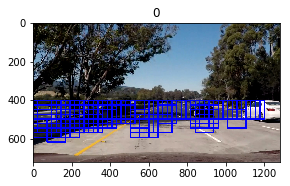

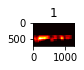

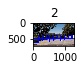

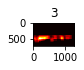

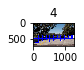

...

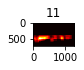

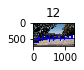

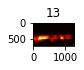

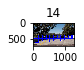

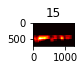

ValueError: num must be 1 <= num <= 16, not 17

In [11]:
img = mpimg.imread('test_images/test1.jpg')

def convert_color(img, conv='RGB2YCrCb'):
    if conv == 'RGB2YCrCb':
        return cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
    if conv == 'BGR2YCrCb':
        return cv2.cvtColor(img, cv2.COLOR_BGR2YCrCb)
    if conv == 'RGB2LUV':
        return cv2.cvtColor(img, cv2.COLOR_RGB2LUV)

out_images = []
out_maps = []
out_titles = []
out_boxes = []



# The list for box including detected vehicle
box_list = []



ystart = 400
ystop = 656
scale = 1.5

for img_src in example_images:
    img_boxes = []
    t = time.time()
    count = 0
    img = mpimg.imread(img_src)
    draw_img = np.copy(img)
#   make a heatmap of zeros
    heatmap = np.zeros_like(img[:,:,0])
    img = img.astype(np.float32)/255
    
    img_tosearch = img[ystart:ystop,:,:]
    ctrans_tosearch = convert_color(img_tosearch, conv='RGB2YCrCb')
    
    if scale != 1:
        imshape = ctrans_tosearch.shape
        ctrans_tosearch = cv2.resize(ctrans_tosearch, (np.int(imshape[1]/scale), np.int(imshape[0]/scale)))
        
    ch1 = ctrans_tosearch[:,:,0]
    ch2 = ctrans_tosearch[:,:,1]
    ch3 = ctrans_tosearch[:,:,2]

    # Define blocks and steps as above
    nxblocks = (ch1.shape[1] // pix_per_cell) - cell_per_block + 1
    nyblocks = (ch1.shape[0] // pix_per_cell) - cell_per_block + 1 
    nfeat_per_block = orient*cell_per_block**2
    
    # 64 was the orginal sampling rate, with 8 cells and 8 pix per cell
    window = 64
    nblocks_per_window = (window // pix_per_cell) - cell_per_block + 1
    cells_per_step = 2  # Instead of overlap, define how many cells to step
    nxsteps = (nxblocks - nblocks_per_window) // cells_per_step
    nysteps = (nyblocks - nblocks_per_window) // cells_per_step
    
    # Compute individual channel HOG features for the entire image
    hog1 = get_hog_features(ch1, orient, pix_per_cell, cell_per_block, feature_vec=False)
    hog2 = get_hog_features(ch2, orient, pix_per_cell, cell_per_block, feature_vec=False)
    hog3 = get_hog_features(ch3, orient, pix_per_cell, cell_per_block, feature_vec=False)
    
    for xb in range(nxsteps):
        for yb in range(nysteps):
            count += 1
            ypos = yb*cells_per_step
            xpos = xb*cells_per_step
            # Extract HOG for this patch
            hog_feat1 = hog1[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_feat2 = hog2[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_feat3 = hog3[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_features = np.hstack((hog_feat1, hog_feat2, hog_feat3))

            xleft = xpos*pix_per_cell
            ytop = ypos*pix_per_cell

            # Extract the image patch
            subimg = cv2.resize(ctrans_tosearch[ytop:ytop+window, xleft:xleft+window], (64,64))
          
            # Get color features
            spatial_features = bin_spatial(subimg, size=spatial_size)
            hist_features = color_hist(subimg, nbins=hist_bins)

            # Scale features and make a prediction
            test_features = X_scaler.transform(np.hstack((spatial_features, hist_features, hog_features)).reshape(1, -1))    
            #test_features = X_scaler.transform(np.hstack((shape_feat, hist_feat)).reshape(1, -1))    
            test_prediction = svc.predict(test_features)
            
            if test_prediction == 1:
                xbox_left = np.int(xleft*scale)
                ytop_draw = np.int(ytop*scale)
                win_draw = np.int(window*scale)
                cv2.rectangle(draw_img,(xbox_left, ytop_draw+ystart),(xbox_left+win_draw,ytop_draw+win_draw+ystart),(0,0,255),6)
                img_boxes.append(((xbox_left, ytop_draw+ystart),(xbox_left+win_draw,ytop_draw+win_draw+ystart)))
                heatmap[ytop_draw+ystart:ytop_draw+win_draw+ystart, xbox_left:xbox_left+win_draw] +=1
            
            print(time.time()-t, 'second tp run, total windows =', count)
            
            out_images.append(draw_img)
            out_titles.append(img_src[-12:])
            out_titles.append(img_src[-12:])
            #heatmap = 255*heatmap/np.max(heatmap)
            out_images.append(heatmap)
            out_maps.append(heatmap)
            out_boxes.append(img_boxes)       

fig = plt.figure(figsize=(12,24))
visualize(fig, 8, 2, out_images, out_titles)

#out_img = find_cars(img, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins)

#plt.imshow(out_img)
#plt.show()

/home/carnd/anaconda3/envs/carnd-term1/lib/python3.5/site-packages/skimage/feature/_hog.py:119: skimage_deprecation: Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15
  'be changed to `L2-Hys` in v0.15', skimage_deprecation)


0.5174455642700195 second tp run, total windows = 294
0.5566058158874512 second tp run, total windows = 294
0.5607845783233643 second tp run, total windows = 294
0.5625724792480469 second tp run, total windows = 294
0.5546629428863525 second tp run, total windows = 294
0.5635364055633545 second tp run, total windows = 294


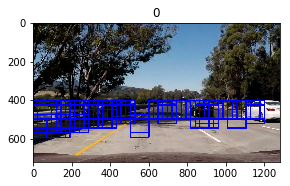

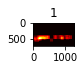

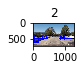

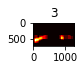

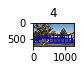

...

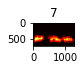

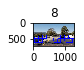

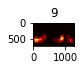

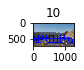

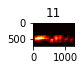

In [14]:
def convert_color(img, conv='RGB2YCrCb'):
    if conv == 'RGB2YCrCb':
        return cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
    if conv == 'BGR2YCrCb':
        return cv2.cvtColor(img, cv2.COLOR_BGR2YCrCb)
    if conv == 'RGB2LUV':
        return cv2.cvtColor(img, cv2.COLOR_RGB2LUV)

out_images = []
out_maps = []
out_titles = []
out_boxes = []

ystart = 400
ystop = 656
scale = 1.5

for img_src in example_images:
    img_boxes = []
    t = time.time()
    count = 0
    img = mpimg.imread(img_src)
    draw_img = np.copy(img)
#   make a heatmap of zeros
    heatmap = np.zeros_like(img[:,:,0])
    img = img.astype(np.float32)/255
    
    img_tosearch = img[ystart:ystop,:,:]
    ctrans_tosearch = convert_color(img_tosearch, conv='RGB2YCrCb')
    
    if scale != 1:
        imshape = ctrans_tosearch.shape
        ctrans_tosearch = cv2.resize(ctrans_tosearch, (np.int(imshape[1]/scale), np.int(imshape[0]/scale)))
        
    ch1 = ctrans_tosearch[:,:,0]
    ch2 = ctrans_tosearch[:,:,1]
    ch3 = ctrans_tosearch[:,:,2]

    # Define blocks and steps as above
    nxblocks = (ch1.shape[1] // pix_per_cell) - cell_per_block + 1
    nyblocks = (ch1.shape[0] // pix_per_cell) - cell_per_block + 1 
    nfeat_per_block = orient*cell_per_block**2
    
    # 64 was the orginal sampling rate, with 8 cells and 8 pix per cell
    window = 64
    nblocks_per_window = (window // pix_per_cell) - cell_per_block + 1
    cells_per_step = 2  # Instead of overlap, define how many cells to step
    nxsteps = (nxblocks - nblocks_per_window) // cells_per_step
    nysteps = (nyblocks - nblocks_per_window) // cells_per_step
    
    # Compute individual channel HOG features for the entire image
    hog1 = get_hog_features(ch1, orient, pix_per_cell, cell_per_block, feature_vec=False)
    hog2 = get_hog_features(ch2, orient, pix_per_cell, cell_per_block, feature_vec=False)
    hog3 = get_hog_features(ch3, orient, pix_per_cell, cell_per_block, feature_vec=False)
    
    for xb in range(nxsteps):
        for yb in range(nysteps):
            count += 1
            ypos = yb*cells_per_step
            xpos = xb*cells_per_step
            # Extract HOG for this patch
            hog_feat1 = hog1[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_feat2 = hog2[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_feat3 = hog3[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_features = np.hstack((hog_feat1, hog_feat2, hog_feat3))

            xleft = xpos*pix_per_cell
            ytop = ypos*pix_per_cell

            # Extract the image patch
            subimg = cv2.resize(ctrans_tosearch[ytop:ytop+window, xleft:xleft+window], (64,64))
          
            # Get color features
            spatial_features = bin_spatial(subimg, size=spatial_size)
            hist_features = color_hist(subimg, nbins=hist_bins)

            # Scale features and make a prediction
            test_features = X_scaler.transform(np.hstack((spatial_features, hist_features, hog_features)).reshape(1, -1))    
            #test_features = X_scaler.transform(np.hstack((shape_feat, hist_feat)).reshape(1, -1))    
            test_prediction = svc.predict(test_features)
            
            if test_prediction == 1:
                xbox_left = np.int(xleft*scale)
                ytop_draw = np.int(ytop*scale)
                win_draw = np.int(window*scale)
                cv2.rectangle(draw_img,(xbox_left, ytop_draw+ystart),(xbox_left+win_draw,ytop_draw+win_draw+ystart),(0,0,255),6)
                img_boxes.append(((xbox_left, ytop_draw+ystart),(xbox_left+win_draw,ytop_draw+win_draw+ystart)))
                heatmap[ytop_draw+ystart:ytop_draw+win_draw+ystart, xbox_left:xbox_left+win_draw] +=1
            
    print(time.time()-t, 'second tp run, total windows =', count)
            
    out_images.append(draw_img)
    out_titles.append(img_src[-12:])
    out_titles.append(img_src[-12:])
    #heatmap = 255*heatmap/np.max(heatmap)
    out_images.append(heatmap)
    out_maps.append(heatmap)
    out_boxes.append(img_boxes)       

fig = plt.figure(figsize=(12,24))
visualize(fig, 8, 2, out_images, out_titles)


In [21]:


# Read in image similar to one shown above 
image = mpimg.imread('test_images/test1.jpg')
heat = np.zeros_like(image[:,:,0]).astype(np.float)


    




# Add heat to each box in box list
heat = add_heat(heat,box_list)
    
# Apply threshold to help remove false positives
heat = apply_threshold(heat,1)

# Visualize the heatmap when displaying    
heatmap = np.clip(heat, 0, 255)

# Find final boxes from heatmap using label function
labels = label(heatmap)
draw_img = draw_labeled_bboxes(np.copy(image), labels)

fig = plt.figure()
plt.subplot(121)
plt.imshow(draw_img)
plt.title('Car Positions')
plt.show()
plt.subplot(122)
plt.imshow(heatmap, cmap='hot')
plt.title('Heat Map')
fig.tight_layout()
plt.show()

NameError: name 'box_list' is not defined

In [27]:
# Define a single function that can extract features using hog sub-sampling and make predictions
def find_cars(img, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins):
    
    draw_img = np.copy(img)
    #make a heatmap of zeros
    heatmap = np.zeros_like(img[:,:,0])
    img = img.astype(np.float32)/255
    
    img_tosearch = img[ystart:ystop,:,:]
    ctrans_tosearch = convert_color(img_tosearch, conv='RGB2YCrCb')
    if scale != 1:
        imshape = ctrans_tosearch.shape
        ctrans_tosearch = cv2.resize(ctrans_tosearch, (np.int(imshape[1]/scale), np.int(imshape[0]/scale)))
        
    ch1 = ctrans_tosearch[:,:,0]
    ch2 = ctrans_tosearch[:,:,1]
    ch3 = ctrans_tosearch[:,:,2]

    # Define blocks and steps as above
    nxblocks = (ch1.shape[1] // pix_per_cell) - cell_per_block + 1
    nyblocks = (ch1.shape[0] // pix_per_cell) - cell_per_block + 1 
    nfeat_per_block = orient*cell_per_block**2
    
    # 64 was the orginal sampling rate, with 8 cells and 8 pix per cell
    window = 64
    nblocks_per_window = (window // pix_per_cell) - cell_per_block + 1
    cells_per_step = 2  # Instead of overlap, define how many cells to step
    nxsteps = (nxblocks - nblocks_per_window) // cells_per_step
    nysteps = (nyblocks - nblocks_per_window) // cells_per_step
    
    # Compute individual channel HOG features for the entire image
    hog1 = get_hog_features(ch1, orient, pix_per_cell, cell_per_block, feature_vec=False)
    hog2 = get_hog_features(ch2, orient, pix_per_cell, cell_per_block, feature_vec=False)
    hog3 = get_hog_features(ch3, orient, pix_per_cell, cell_per_block, feature_vec=False)
    
    for xb in range(nxsteps):
        for yb in range(nysteps):
            ypos = yb*cells_per_step
            xpos = xb*cells_per_step
            # Extract HOG for this patch
            hog_feat1 = hog1[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_feat2 = hog2[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_feat3 = hog3[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_features = np.hstack((hog_feat1, hog_feat2, hog_feat3))

            xleft = xpos*pix_per_cell
            ytop = ypos*pix_per_cell

            # Extract the image patch
            subimg = cv2.resize(ctrans_tosearch[ytop:ytop+window, xleft:xleft+window], (64,64))
          
            # Get color features
            spatial_features = bin_spatial(subimg, size=spatial_size)
            hist_features = color_hist(subimg, nbins=hist_bins)

            # Scale features and make a prediction
            test_features = X_scaler.transform(np.hstack((spatial_features, hist_features, hog_features)).reshape(1, -1))    
            #test_features = X_scaler.transform(np.hstack((shape_feat, hist_feat)).reshape(1, -1))    
            test_prediction = svc.predict(test_features)
            
            if test_prediction == 1:
                xbox_left = np.int(xleft*scale)
                ytop_draw = np.int(ytop*scale)
                win_draw = np.int(window*scale)
                cv2.rectangle(draw_img,(xbox_left, ytop_draw+ystart),(xbox_left+win_draw,ytop_draw+win_draw+ystart),(0,0,255),6)
                img_boxes.append(((xbox_left, ytop_draw+ystart),(xbox_left+win_draw,ytop_draw+win_draw+ystart)))
                heatmap[ytop_draw+ystart:ytop_draw+win_draw+ystart, xbox_left:xbox_left+win_draw] +=1
                
    return draw_img, heatmap

In [22]:
from scipy.ndimage.measurements import label

# Read in image similar to one shown above 
image = mpimg.imread('test_images/test1.jpg')
heat = np.zeros_like(image[:,:,0]).astype(np.float)

def add_heat(heatmap, bbox_list):
    # Iterate through list of bboxes
    for box in bbox_list:
        # Add += 1 for all pixels inside each bbox
        # Assuming each "box" takes the form ((x1, y1), (x2, y2))
        heatmap[box[0][1]:box[1][1], box[0][0]:box[1][0]] += 1

    # Return updated heatmap
    return heatmap# Iterate through list of bboxes
    
def apply_threshold(heatmap, threshold):
    # Zero out pixels below the threshold
    heatmap[heatmap <= threshold] = 0
    # Return thresholded map
    return heatmap

def draw_labeled_bboxes(img, labels):
    # Iterate through all detected cars
    for car_number in range(1, labels[1]+1):
        # Find pixels with each car_number label value
        nonzero = (labels[0] == car_number).nonzero()
        # Identify x and y values of those pixels
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        # Define a bounding box based on min/max x and y
        bbox = ((np.min(nonzerox), np.min(nonzeroy)), (np.max(nonzerox), np.max(nonzeroy)))
        # Draw the box on the image
        cv2.rectangle(img, bbox[0], bbox[1], (0,0,255), 6)
    # Return the image
    return img

/home/carnd/anaconda3/envs/carnd-term1/lib/python3.5/site-packages/skimage/feature/_hog.py:119: skimage_deprecation: Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15
  'be changed to `L2-Hys` in v0.15', skimage_deprecation)


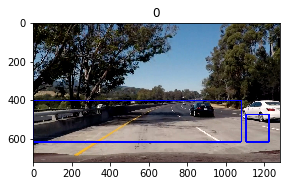

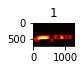

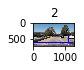

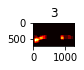

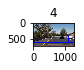

...

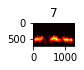

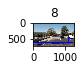

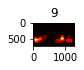

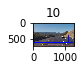

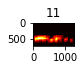

In [28]:
out_images = []
out_maps = []

ystart = 400
ystop = 656
scale = 1.5

#Iterate over test images
for img_src in example_images:
    img = mpimg.imread(img_src)
    out_img, heat_map = find_cars(img, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins)
    labels = label(heatmap)
    #draw bounding boxes on a copy of the image
    draw_img = draw_labeled_bboxes(np.copy(img), labels)
    out_images.append(draw_img)
    out_images.append(heat_map)

fig = plt.figure(figsize=(12,24))
visualize(fig, 8, 2, out_images, out_titles)

In [12]:
def process_image(image):
    
    out_img = find_cars(image, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins)
    heat = np.zeros_like(image[:,:,0]).astype(np.float)
    # Add heat to each box in box list
    heat = add_heat(heat,box_list)
    
    # Apply threshold to help remove false positives
    heat = apply_threshold(heat,1)

    # Visualize the heatmap when displaying    
    heatmap = np.clip(heat, 0, 255)
    labels = label(heatmap)
    # Draw bounding boxes on a copy of the image
    draw_img = draw_labeled_bboxes(np.copy(img), labels)
    return draw_img

In [29]:
def process_image(img):
    
    out_img, heatmap = find_cars(img, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins)
    labels = label(heatmap)
    # Draw bounding boxes on a copy of the image
    draw_img = draw_labeled_bboxes(np.copy(img), labels)
    return draw_img

/home/carnd/anaconda3/envs/carnd-term1/lib/python3.5/site-packages/skimage/feature/_hog.py:119: skimage_deprecation: Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15
  'be changed to `L2-Hys` in v0.15', skimage_deprecation)


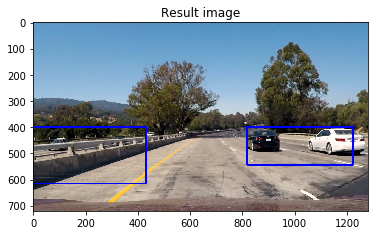

In [31]:
# Import everything needed to edit/save/watch video clips

from IPython.display import HTML



[MoviePy] >>>> Building video test.mp4
[MoviePy] Writing video test.mp4


 97%|█████████▋| 38/39 [00:19<00:00,  2.01it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: test.mp4 



HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(test_output))

[MoviePy] >>>> Building video porject_output1.mp4
[MoviePy] Writing video porject_output1.mp4


 99%|█████████▉| 125/126 [01:04<00:00,  1.93it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: porject_output1.mp4 



In [33]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
 """.format(project_output))